# Fathomnet 2023 Out of Sample Detection in the Deep Ocean

Ocean-going camera systems have provided scientists to a vast amount of data that allows them to monitor populations and discover new sea creatures. oceangoing platforms commonly integrate high-resolution, multi-camera video feedss for scientific observation, producing high amounts of high quality visual data.

There have been a wide variety of models deployed to assist in sorting visual data, but these models do not generalize well to new situations, such as different cameras, different illumination, new organisms appearing, or changes in the appearence of the seafloor. 

For this project, our goal is to create a model that is able to generalize to new situations. Our training set is a collection of images from the upper ocean (< 800 m) while the target data is collected from deeper waters.This is a common problem in ocean research.  Such out-of-sample detection could help scientists discover new animals and improve ecosystem management practices. 

Kaggle competition:https://www.kaggle.com/competitions/fathomnet-out-of-sample-detection

Files:

multilabel_classification/train.csv - csv list of training images and categories

object_detection/train.json - the training images, annotations, and categories in COCO formatted json

object_detection/eval.json - the evaluation images in COCO formatted json

sample_submission.csv - a sample submission file in the correct format

category_key.csv - key mapping numerical index to category and supercategory name

demo_download.ipynb - python notebook demonstrating download script

download_images.py - python script to download imagery from FathomNet using COCO formatted json

requirements.txt - python requirements to run the download script

FathomNet 2023.mp4 - Final presentatiton

output.csv - output file for submission

In [4]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import json
import urllib.request
import os
import torch
from fastai.vision.all import *
from fastdownload import download_url
from PIL import ImageFile
import os
ImageFile.LOAD_TRUNCATED_IMAGES = True


In [5]:
print(torch.cuda.is_available())
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')



True


In [6]:
image_path = r'E:\ds\Fathomnet out of sample detection\object_detection\images'
test_image_path = r'E:\ds\Fathomnet out of sample detection\object_detection\images_test'

In [7]:
images = os.listdir(image_path)
test_images = os.listdir(test_image_path)

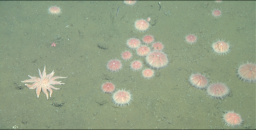

In [6]:
from fastai.vision.all import *
im = Image.open(image_path + '\\' + images[2])
im.to_thumb(256,256)

In [7]:
train_image_count = len(images)
test_image_count = len(test_images)
print(f"Number of images in train directory: {train_image_count}")
print(f"Number of images in test directory: {test_image_count}")


Number of images in train directory: 5950
Number of images in test directory: 10745


We want to check the image dimensions to determine whether we should resize the images if they are particularly large. Given the large number of images in the train dataset, large resolutions may need to be reduced to train the model more efficiently. 

We also want to check whether all images have the same resolution. If they do not, we may consider resizing them to the same size. 

In [8]:

# Check image dimensions
dimensions = [Image.open(os.path.join(image_path, img)).size for img in images]
most_common_dim = max(set(dimensions), key=dimensions.count)
print(f"Most common dimensions: {most_common_dim}")

# Check distribution of image channels (for the train set)
channels = [Image.open(os.path.join(image_path, img)).mode for img in images]
channel_dist = {mode: channels.count(mode) for mode in set(channels)}
print(f"Channel distribution: {channel_dist}")

Most common dimensions: (1920, 1080)
Channel distribution: {'RGB': 5491, 'RGBA': 459}


We will also check other potential interesting values in our dataset by looking at the following:
* Color distribution - To compare the color distribution of the train and test sets. 
* Average image brightness and contrast
* Image file sizes
* Check for corrupted images - these should not exist given that this dataset has been curated for us. However, it is a good idea to always check in case there were any errors in the download process. 

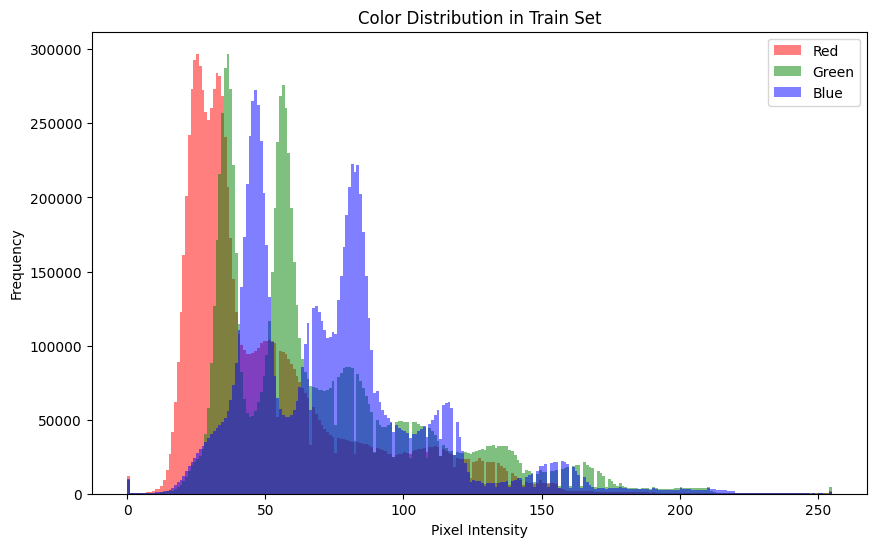

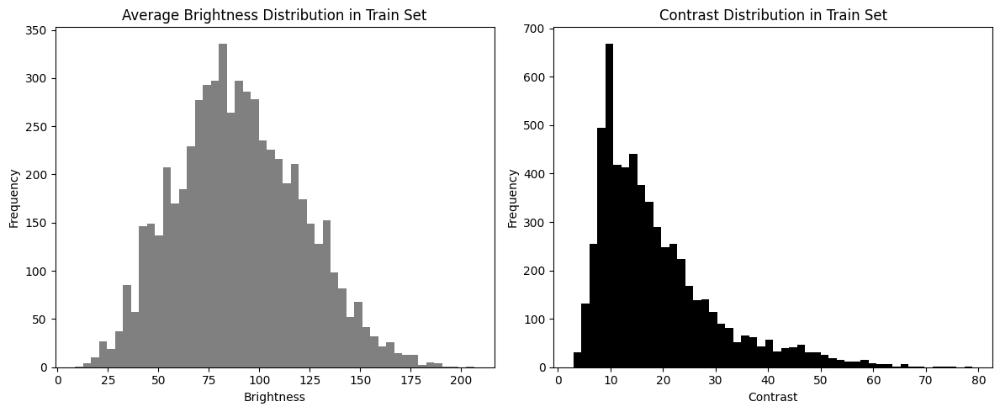

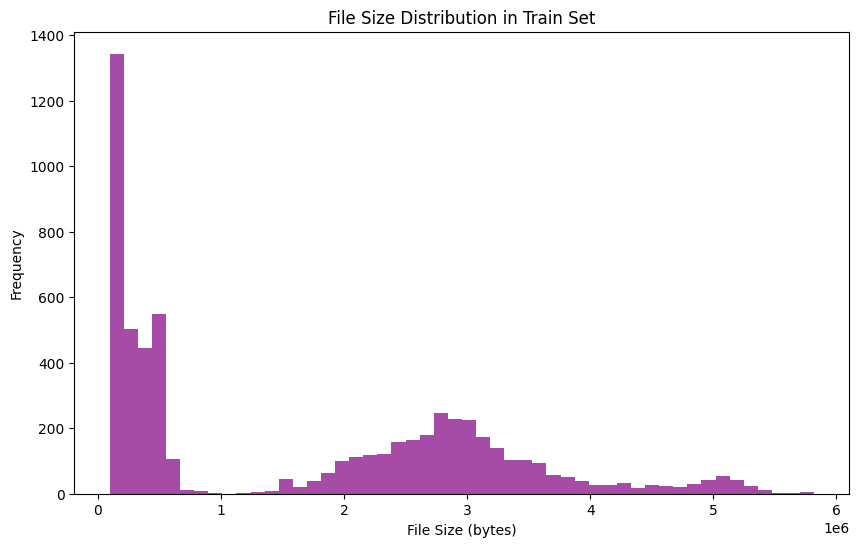

No corrupted images found in train set.


In [51]:
import numpy as np

# Sample images from train dataset for intensive operations
train_sample_images = random.sample(images, min(10, len(images)))

# 1. Color Distribution
reds, greens, blues = [], [], []
for img in train_sample_images:
    image = Image.open(os.path.join(image_path, img))
    r, g, b = image.split()
    reds.extend(np.array(r).flatten())
    greens.extend(np.array(g).flatten())
    blues.extend(np.array(b).flatten())

plt.figure(figsize=(10, 6))
plt.hist(reds, bins=255, color='red', alpha=0.5, label='Red')
plt.hist(greens, bins=255, color='green', alpha=0.5, label='Green')
plt.hist(blues, bins=255, color='blue', alpha=0.5, label='Blue')
plt.title('Color Distribution in Train Set')
plt.xlabel('Pixel Intensity')
plt.ylabel('Frequency')
plt.legend()
plt.show()

# 2. Average Image Brightness & Contrast
brightnesses, contrasts = [], []
for img in images:
    image = Image.open(os.path.join(image_path, img)).convert('L')  # Convert to grayscale
    brightnesses.append(np.mean(image))
    contrasts.append(np.std(image))

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.hist(brightnesses, bins=50, color='gray')
plt.title('Average Brightness Distribution in Train Set')
plt.xlabel('Brightness')
plt.ylabel('Frequency')

plt.subplot(1, 2, 2)
plt.hist(contrasts, bins=50, color='black')
plt.title('Contrast Distribution in Train Set')
plt.xlabel('Contrast')
plt.ylabel('Frequency')
plt.tight_layout()
plt.show()

# 5. Image File Size Distribution
file_sizes = [os.path.getsize(os.path.join(image_path, img)) for img in images]
plt.figure(figsize=(10, 6))
plt.hist(file_sizes, bins=50, color='purple', alpha=0.7)
plt.title('File Size Distribution in Train Set')
plt.xlabel('File Size (bytes)')
plt.ylabel('Frequency')
plt.show()

# 6. Check for Corrupted Images
corrupted = []
for img in images:
    try:
        with Image.open(os.path.join(image_path, img)) as im:
            im.verify()
    except Exception:
        corrupted.append(img)

if corrupted:
    print(f"Found {len(corrupted)} corrupted images in train set.")
else:
    print("No corrupted images found in train set.")


We will further check for any interesting features in the data:
* Aspect ratio distribution - this can give us insight into the orientations and shapes of the images. While we do not expect anything unusual from our train and test datasets, it is a good idea to check. 
* Resolution distribution - We will visualize the distribution of image ressolutions to understand the consistency of image sizes. 
* Presence of Alpha Channel: Some images may have an alpha channel in addition to RGB. We do not expect this to be the case with our train and test datasets, it is good to be aware of this for certain preprocessing steps. 
* Valuzation if images with highest and lowesst brightness/contrast - This may help to identify outliers or potential issues with the datasets. 

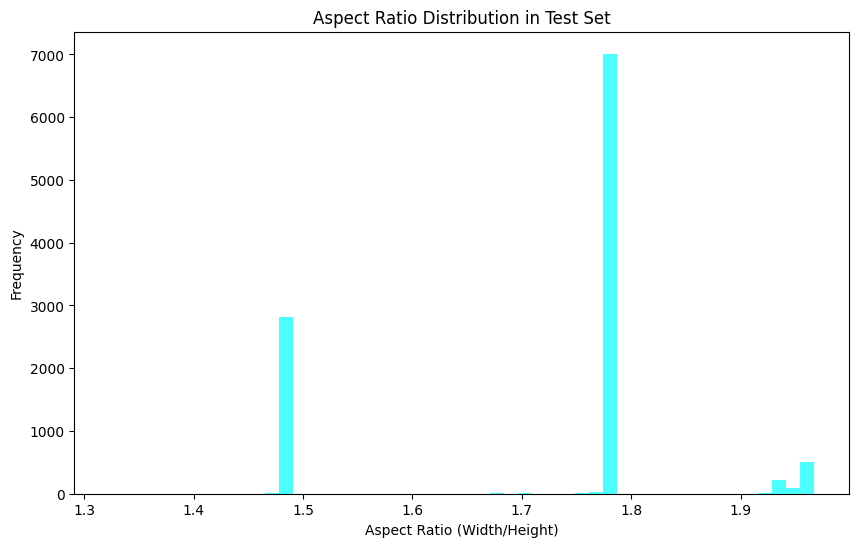

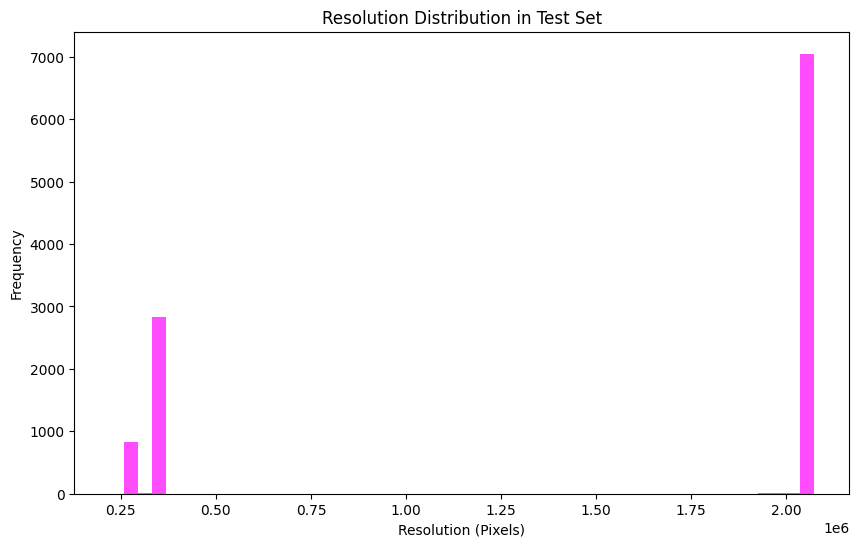

Number of images with an alpha channel in test set: 243


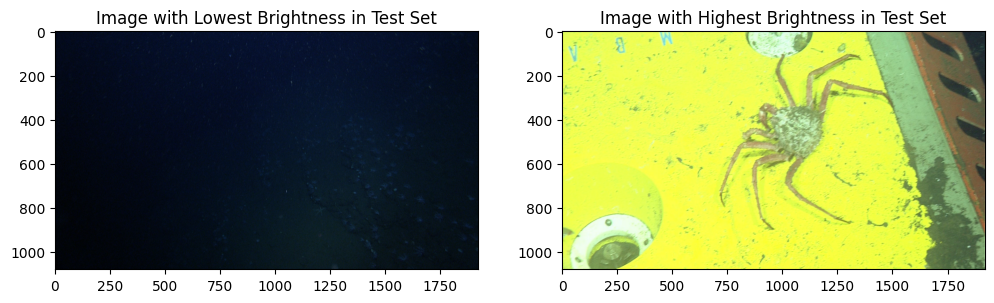

In [38]:
# 1. Aspect Ratio Distribution
test_aspect_ratios = []
for img in test_images:
    image = Image.open(os.path.join(test_image_path, img))
    w, h = image.size
    test_aspect_ratios.append(w/h)

plt.figure(figsize=(10, 6))
plt.hist(test_aspect_ratios, bins=50, color='cyan', alpha=0.7)
plt.title('Aspect Ratio Distribution in Test Set')
plt.xlabel('Aspect Ratio (Width/Height)')
plt.ylabel('Frequency')
plt.show()

# 2. Resolution Distribution
test_resolutions = []
for img in test_images:
    image = Image.open(os.path.join(test_image_path, img))
    w, h = image.size
    test_resolutions.append(w*h)

plt.figure(figsize=(10, 6))
plt.hist(test_resolutions, bins=50, color='magenta', alpha=0.7)
plt.title('Resolution Distribution in Test Set')
plt.xlabel('Resolution (Pixels)')
plt.ylabel('Frequency')
plt.show()

# 3. Presence of Alpha Channel
test_has_alpha = 0
for img in test_images:
    image = Image.open(os.path.join(test_image_path, img))
    if image.mode == 'RGBA':
        test_has_alpha += 1

print(f"Number of images with an alpha channel in test set: {test_has_alpha}")

# 4. Visualization of Images with Highest and Lowest Brightness
test_brightnesses = []
for img in test_images:
    image = Image.open(os.path.join(test_image_path, img)).convert('L')  # Convert to grayscale
    test_brightnesses.append(np.mean(image))

test_min_brightness_idx = test_brightnesses.index(min(test_brightnesses))
test_max_brightness_idx = test_brightnesses.index(max(test_brightnesses))

test_min_brightness_image = Image.open(os.path.join(test_image_path, test_images[test_min_brightness_idx]))
test_max_brightness_image = Image.open(os.path.join(test_image_path, test_images[test_max_brightness_idx]))

plt.figure(figsize=(12, 5))
plt.subplot(1, 2, 1)
plt.imshow(test_min_brightness_image)
plt.title('Image with Lowest Brightness in Test Set')

plt.subplot(1, 2, 2)
plt.imshow(test_max_brightness_image)
plt.title('Image with Highest Brightness in Test Set')
plt.show()


As expected, our exploratory data analysis shows that there is a wide variation of properties such as color distribution. This is expected, expected from a visual inspection of the data. 

We also have an imbalance within the labels. There are potential solutions that we will consider in our data preprocessing steps and model building:

* Data augmentation.
* Removing outliers from train dataset for brightness/contrast
* Relabel outlier labels to 'unknown'.
* Feature level methods - extract features from the images and employ methodss to normalize or standardize these features to reduce bias in the model. 

# Data Augmentation and Model

We will augment the labeling by including the key values in our train dataframe.
 
Labels were not removed as it decreased performance of the model.

In [8]:
key_df = pd.read_csv(r'E:\ds\Fathomnet out of sample detection\category_key.csv')
key_df['id' ] = key_df['id'].astype(int)
def lookup(x):
    for i in range(len(x)):
        value = x[i]
        if value in key_df['id'].values:
            x[i] = key_df[key_df['id'] == value]['name'].values[0]
    return x
lookup([3.0, 4.0, 5, 6, 7, 8, 9, 10, 11, 12, 13])




['Actiniidae',
 'Actinoscyphia',
 'Bolocera',
 'Dofleinia',
 'Hormathiidae',
 'Isosicyonis',
 'Liponema brevicorne',
 'Metridium farcimen',
 'Actinopterygii',
 'Agonidae',
 'Albatrossia pectoralis']

In [9]:
# Define train csv
train = pd.read_csv(r'E:\ds\Fathomnet out of sample detection\multilabel_classification\train.csv')

# Use lookup function to convert id to name by applying the lookup function

# Create an array from train 'categories' column

categories_array = train['categories'].apply(lambda x: np.array(x)).values


for i in range(len(categories_array)):
    # Convert to a set
    categories_array[i] = set(categories_array[i])
    # Remove non-numeric characters and convert to int
    categories_array[i] = {int(x) for x in categories_array[i] if x.isnumeric() and int(x) != 0}

train['categories_set'] = categories_array


# Use the lookup function on categories_set column
train['categories_set'] = tuple(train['categories_set'].apply(lambda x: lookup(list(x))))

train['categories'] = tuple(train['categories_set'])
train.head()

,id,categories,categories_set
0,3b6f01ae-5bde-434d-9b06-79b269421ed6,[Actiniaria],[Actiniaria]
1,dce21f7c-20e5-482b-bd90-c038f8464c03,[Actiniaria],[Actiniaria]
2,4a7f2199-772d-486d-b8e2-b651246316b5,[Actiniaria],[Actiniaria]
3,3bddedf6-4ff8-4e81-876a-564d2b03b364,"[Isosicyonis, Liponema brevicorne, Actiniaria]","[Isosicyonis, Liponema brevicorne, Actiniaria]"
4,3f735021-f5de-4168-b139-74bf2859d12a,"[Actiniaria, Actiniidae, Bolocera, Hormathiidae, Liponema brevicorne]","[Actiniaria, Actiniidae, Bolocera, Hormathiidae, Liponema brevicorne]"


In [10]:
# Get the label from a windows path input
def get_labels(fn):
    file_path = fn
    filename = os.path.basename(file_path)[:-4] # remove .png extension
    labels_df = train
    labels_dict = dict(zip(labels_df["id"], labels_df["categories"]))
    # Convert to a hashable type
    labels_dict = {str(k): v for k, v in labels_dict.items()}
    # Return a hashable type
    return labels_dict[filename]
print(get_labels(images[2]))



['Liponema brevicorne', 'Actiniaria', 'Dofleinia']


We verify that the preprocessing functions as expected.

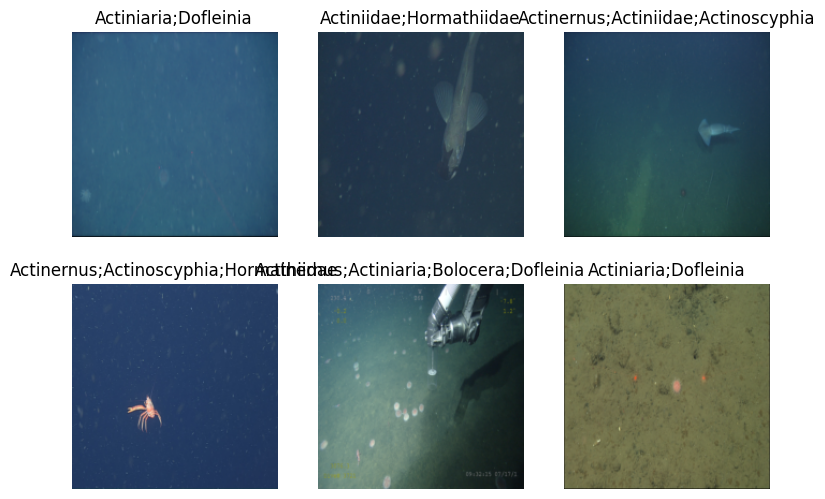

In [11]:
dls = DataBlock(
    # Include delimiter in multicategoryblock
    blocks=(ImageBlock, MultiCategoryBlock
),
    get_items=get_image_files,
    splitter=RandomSplitter(valid_pct=0.2, seed=42),
    get_y= get_labels,
    item_tfms=[Resize(192, method='squish')]
).dataloaders(image_path)
dls.show_batch(max_n=6)

# Model Creation

ResNet is one of the best performing architectures for image classification. For this model, I tested several different versions of ResNet and other models and compared their performance. Ultimately, ResNet-152 performed the best on this task. ResNet has 152 layers, allowing the model to learn a large number of features from the input data, making it suitable for complex tasks. 

In [12]:
# Create a model with the training data
learn = vision_learner(dls, resnet152, metrics=accuracy_multi)
learn.fine_tune(1)


epoch,train_loss,valid_loss,accuracy_multi,time


In [19]:
train_loss, train_metrics = learn.validate(dl=dls.train)

print(f'Train loss: {train_loss}, Train accuracy: {train_metrics}')

Train loss: 0.14845460653305054, Train accuracy: 0.9530782103538513


In [22]:
# Export the model to a pkl file
learn.export(r'E:\ds\Fathomnet out of sample detection\multilabel_classification\export.pkl')

print('Model exported successfully!')

Model exported successfully!


# Model Selection and Hyperparameter Tuning

We will test out several different models and tune hyperparameters. 

Please note: the output has been cleared to preserve memory. This was run separately from the model trained above. The best performance of this tuning informed the choice of resnet152 and hyperparameter choice.



In [28]:
import pandas as pd

architectures = [resnet34, resnet50, resnet152, vgg16_bn, densenet121]

results = []

# Use a fixed learning rate
lr = 1e-3

# Take a subset of the data
train_items = list(dls.train_ds)[:256]
valid_items = list(dls.valid_ds)[:256]

# Create new DataLoaders with the subset
dls_sub = dls.new(train_ds=train_items, valid_ds=valid_items)

for arch in architectures:
    # Initialize learner for the architecture
    learn = vision_learner(dls_sub, arch, metrics=accuracy_multi)
    
    # Fine-tune model using the fixed learning rate
    learn.fine_tune(1, base_lr=lr)
    
    train_loss, train_accuracy = learn.validate(dl=dls_sub.train)
    
    # Append results to our list
    results.append({
        'Architecture': arch.__name__,
        'Train Loss': train_loss,
        'Train Accuracy': train_accuracy
    })

# Convert results to pandas DataFrame
df_results = pd.DataFrame(results)
print(df_results)


In [ ]:
import pandas as pd

architectures = [resnet34, resnet50, resnet152, vgg16_bn, densenet121]

results = []

# Use a fixed learning rate
lr = 0.01

# Take a subset of the data
train_items = list(dls.train_ds)[:256]
valid_items = list(dls.valid_ds)[:256]

# Create new DataLoaders with the subset
dls_sub = dls.new(train_ds=train_items, valid_ds=valid_items)

for arch in architectures:
    # Initialize learner for the architecture
    learn = vision_learner(dls_sub, arch, metrics=accuracy_multi)
    
    # Fine-tune model using the fixed learning rate
    learn.fine_tune(1, base_lr=lr)
    
    train_loss, train_accuracy = learn.validate(dl=dls_sub.train)
    
    # Append results to our list
    results.append({
        'Architecture': arch.__name__,
        'Train Loss': train_loss,
        'Train Accuracy': train_accuracy
    })

# Convert results to pandas DataFrame
df_results = pd.DataFrame(results)
print(df_results)


# Model export

In [25]:
# Test the model on a new image

# Create a test image
test_image = r'E:\ds\Fathomnet out of sample detection\images_test\772004--372cce99-76c2-44d4-a67f-687930fafa6a.png'

# Load the model
learn = load_learner(r'E:\ds\Fathomnet out of sample detection\multilabel_classification\export.pkl')

# Predict the image
preds = learn.predict(test_image)


# Get the predicted labels
preds[0]

# Get the probabilities
preds[2]


# Export a csv file with the filename and predicted labels
test_images = os.listdir(r'E:\ds\Fathomnet out of sample detection\images_test')

# Create a dataframe with the filenames
test_df = pd.DataFrame(test_images, columns=['filename'])

# Add the predicted labels to the dataframe
test_df['predicted_labels'] = test_df['filename'].apply(lambda x: learn.predict(r'E:\ds\Fathomnet out of sample detection\images_test' + '\\' + x)[0])





We calculate and normalize the OSD score. The higher the score, the higher the probability that the image is out of sample.

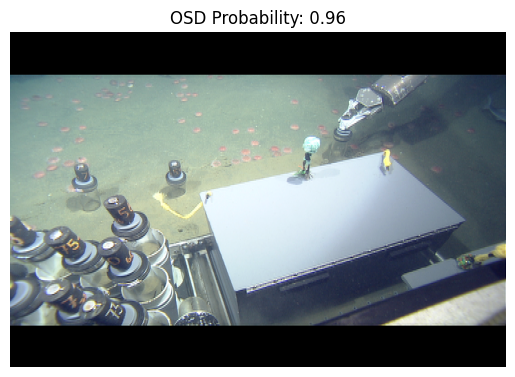

In [24]:
import pandas as pd
import os
from fastai.vision.all import *
from scipy.special import softmax
import matplotlib.pyplot as plt

# Define the function to calculate the OSD score for a single image

def osd_score_single_image(learn, image_path):
    # Load the image
    img = PILImage.create(image_path)
    # Get the predicted labels
    preds = learn.predict(img)
    # Get the probabilities
    probs = preds[2]
    # Convert to numpy array
    probs = np.array(probs)
    # Apply softmax to get the entropy
    entropy = softmax(probs)
    # Calculate the OSD score
    osd_score = -np.sum(entropy * np.log(entropy))
    return osd_score


# Load the model
learn = load_learner(r'E:\ds\Fathomnet out of sample detection\multilabel_classification\export.pkl')

# Image path
image_path = r'E:\ds\Fathomnet out of sample detection\object_detection\images_test\00a0a17f-835d-40b7-9c10-ba98b1df3682.png'

# Calculate OSD score for the single image
entropy = osd_score_single_image(learn, image_path)

# Convert entropy to OSD probability
max_entropy = np.log(len(learn.dls.vocab))
osd_prob = entropy / max_entropy

# Plot the image with the OSD score
img = PILImage.create(image_path)
plt.imshow(img)
plt.title(f"OSD Probability: {osd_prob:.2f}")
plt.axis('off')
plt.show()


In [ ]:
import os
import pandas as pd
from fastai.vision.all import *

def osd_score_single_image(learn, image_path):
    # Load the image
    img = PILImage.create(image_path)
    # Get the predicted labels
    preds = learn.predict(img)
    # Get the probabilities
    probs = preds[2]
    # Convert to numpy array
    probs = np.array(probs)
    # Apply softmax to get the entropy
    entropy = softmax(probs)
    # Calculate the OSD score
    osd_score = -np.sum(entropy * np.log(entropy))
    return osd_score, [label.item() for label in preds[1]]  # Convert tensor to Python boolean list

# Load the model
learn = load_learner(r'E:\ds\Fathomnet out of sample detection\multilabel_classification\export.pkl')

# Load category key and create a dictionary mapping category names to IDs
category_key_df = pd.read_csv(r'E:\ds\Fathomnet out of sample detection\category_key.csv')
category_to_id = dict(zip(category_key_df['name'], category_key_df['id']))

# Get all image paths in the test directory
image_dir = r'E:\ds\Fathomnet out of sample detection\object_detection\images_test'
image_paths = [os.path.join(image_dir, fname) for fname in os.listdir(image_dir) if fname.endswith(('.png', '.jpg', '.jpeg'))]

# Create a test_df dataframe
test_df = pd.DataFrame({
    'id': [os.path.splitext(os.path.basename(path))[0] for path in image_paths],
    'path': image_paths
})

# Define output file path
output_file = r'E:\ds\Fathomnet out of sample detection\object_detection\output.csv'

# Check if the file exists, if not create with header
if not os.path.exists(output_file):
    with open(output_file, 'w') as f:
        f.write('id,categories,osd\n')

for _, row in test_df.iterrows():
    # Calculate OSD score for the single image
    entropy, label_flags = osd_score_single_image(learn, row['path'])
    
    # Convert the boolean flags to actual label names
    active_label_names = [label for idx, label in enumerate(learn.dls.vocab) if label_flags[idx]]
    
    # Convert label names to their respective IDs
    active_label_ids = [category_to_id[name] for name in active_label_names if name in category_to_id]
    
    # Convert entropy to OSD probability
    max_entropy = np.log(len(learn.dls.vocab))
    osd_prob = entropy / max_entropy
    
    # Append results to CSV
    with open(output_file, 'a') as f:
        f.write(f"{row['id']},{' '.join(map(str, active_label_ids))},{osd_prob}\n")


KeyboardInterrupt: 

# Conclusion

Our final model performed reasonably well with a score of 0.309 in the Kaggle competition. 

This would have placed us at approximately 13th-14th place in the competition, were it still active, based on the leaderboards. 

There are several options to improve performance:
* FathomNet provides the depth directly on their open-source data. We could have build a model to predict the depth rather than rely on OSD score. This may have significantly improved performance of the model as we would rely on the actual predicted depths rather than 